In [2]:
# import sys
# !{sys.executable} -m pip install --upgrade pip
# !{sys.executable} -m pip install -r requirements.txt

In [3]:
import numpy as np
import pandas as pd
import datetime
import random
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 18})
plt.style.use('ggplot')
import seaborn as sns
from scipy import stats
from sklearn.impute import SimpleImputer
import shap
from sklearn.preprocessing import StandardScaler
warnings.filterwarnings("ignore", category=FutureWarning)


In [5]:
import pandas as pd
df = pd.read_csv(r"./data_set.csv")

print("Number of df samples are",df.shape)

categorical_features = ['State_Factor', 'building_class', 'facility_type']
numerical_features=df.select_dtypes('number').columns


Number of df samples are (75757, 64)


In [6]:
df.head()

,Year_Factor,State_Factor,building_class,facility_type,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
0,1,State_1,Commercial,Grocery_store_or_food_market,61242.0,1942.0,11.0,2.4,36,50.5,...,14,0,0,0,1.0,1.0,1.0,NaN,248.682615,0
1,1,State_1,Commercial,Warehouse_Distribution_or_Shipping_center,274000.0,1955.0,45.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,26.500150,1
2,1,State_1,Commercial,Retail_Enclosed_mall,280025.0,1951.0,97.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,24.693619,2
3,1,State_1,Commercial,Education_Other_classroom,55325.0,1980.0,46.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,48.406926,3
4,1,State_1,Commercial,Warehouse_Nonrefrigerated,66000.0,1985.0,100.0,2.4,36,50.5,...,14,0,0,0,1.0,1.0,1.0,NaN,3.899395,4


Text(0.5, 1.0, 'Missing values in  Data')

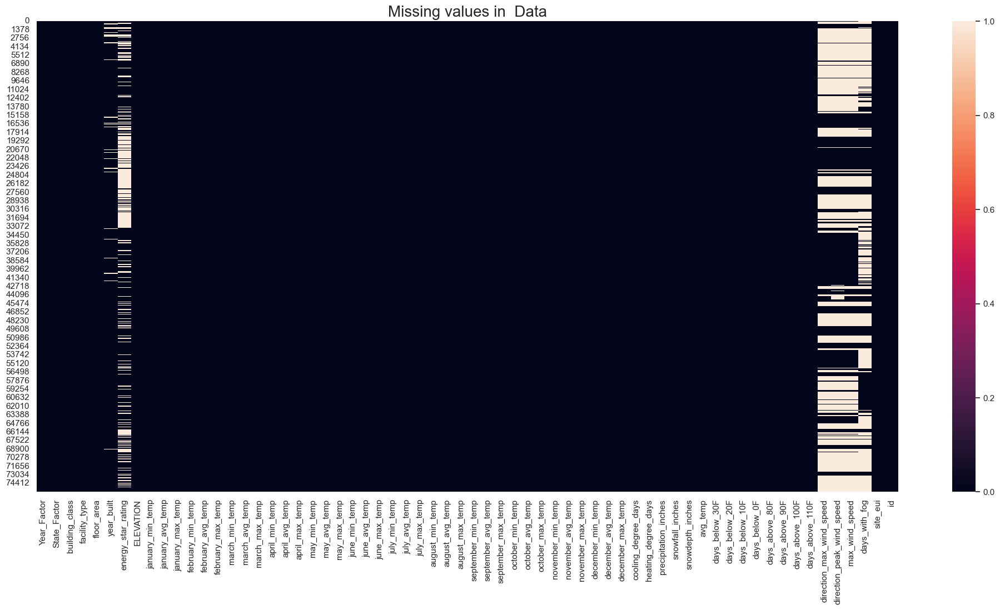

In [44]:
plt.figure(figsize = (25,11))
sns.heatmap(df.isna().values, xticklabels=df.columns)
plt.title("Missing values in  Data", size=20)

In [25]:
missing_columns = [col for col in df.columns if df[col].isnull().any()]
missingvalues_count =df.isna().sum()
missingValues_df = pd.DataFrame(missingvalues_count.rename('Null Values Count')).loc[missingvalues_count.ne(0)]
missingValues_df.style.background_gradient(cmap="Pastel1")

df['year_built'] =df['year_built'].replace(np.nan, 2022)
null_col=['energy_star_rating','direction_max_wind_speed','direction_peak_wind_speed','max_wind_speed','days_with_fog']
imputer = SimpleImputer()
imputer.fit(df[null_col])
data_transformed = imputer.transform(df[null_col])
df[null_col] = pd.DataFrame(data_transformed)

In [7]:
# plt.figure(figsize = (25,11))
# sns.heatmap(df.isna().values, xticklabels=df.columns)
# plt.title("Missing values in training Data", size=20)

EDA

In [19]:
df_new2['facility_type'].unique()

array(['Grocery_store_or_food_market',
       'Warehouse_Distribution_or_Shipping_center',
       'Retail_Enclosed_mall', 'Education_Other_classroom',
       'Warehouse_Nonrefrigerated', 'Warehouse_Selfstorage',
       'Office_Uncategorized', 'Data_Center', 'Commercial_Other',
       'Mixed_Use_Predominantly_Commercial',
       'Office_Medical_non_diagnostic', 'Education_College_or_university',
       'Industrial', 'Laboratory',
       'Public_Assembly_Entertainment_culture',
       'Retail_Vehicle_dealership_showroom', 'Retail_Uncategorized',
       'Lodging_Hotel', 'Retail_Strip_shopping_mall',
       'Education_Uncategorized', 'Health_Care_Inpatient',
       'Public_Assembly_Drama_theater', 'Public_Assembly_Social_meeting',
       'Religious_worship', 'Mixed_Use_Commercial_and_Residential',
       'Office_Bank_or_other_financial', 'Parking_Garage',
       'Commercial_Unknown', 'Service_Vehicle_service_repair_shop',
       'Service_Drycleaning_or_Laundry', 'Public_Assembly_Recreation

In [18]:
df_new2['building_class'].unique()

array(['Commercial', 'Residential'], dtype=object)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75757 entries, 0 to 75756
Data columns (total 64 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Year_Factor                75757 non-null  int64  
 1   State_Factor               75757 non-null  object 
 2   building_class             75757 non-null  object 
 3   facility_type              75757 non-null  object 
 4   floor_area                 75757 non-null  float64
 5   year_built                 73920 non-null  float64
 6   energy_star_rating         49048 non-null  float64
 7   ELEVATION                  75757 non-null  float64
 8   january_min_temp           75757 non-null  int64  
 9   january_avg_temp           75757 non-null  float64
 10  january_max_temp           75757 non-null  int64  
 11  february_min_temp          75757 non-null  int64  
 12  february_avg_temp          75757 non-null  float64
 13  february_max_temp          75757 non-null  int

Get those sweet summary stats on each column to understand the distribution better

In [27]:
# statistical distribution
df.describe()

,Year_Factor,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
count,75757.000000,7.575700e+04,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,...,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000
mean,4.367755,1.659839e+05,1953.996726,61.048605,39.506323,11.432343,34.310468,59.054952,11.720567,35.526837,...,82.709809,14.058701,0.279539,0.002442,66.552675,62.779974,4.190601,109.142051,82.584693,37878.000000
std,1.471441,2.468758e+05,38.139247,23.063738,60.656596,9.381027,6.996108,5.355458,12.577272,8.866697,...,25.282913,10.943996,2.252323,0.142140,88.726751,87.226977,4.369629,31.883663,58.255403,21869.306509
min,1.000000,9.430000e+02,0.000000,0.000000,-6.400000,-19.000000,10.806452,42.000000,-13.000000,13.250000,...,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,12.000000,1.001169,0.000000
25%,3.000000,6.237900e+04,1927.000000,56.000000,11.900000,6.000000,29.827586,56.000000,2.000000,31.625000,...,72.000000,6.000000,0.000000,0.000000,1.000000,1.000000,1.000000,109.142051,54.528601,18939.000000
50%,5.000000,9.136700e+04,1953.000000,61.048605,25.000000,11.000000,34.451613,59.000000,9.000000,34.107143,...,84.000000,12.000000,0.000000,0.000000,66.552675,62.779974,4.190601,109.142051,75.293716,37878.000000
75%,6.000000,1.660000e+05,1981.000000,76.000000,42.700000,13.000000,37.322581,62.000000,20.000000,40.879310,...,97.000000,17.000000,0.000000,0.000000,66.552675,62.779974,4.190601,109.142051,97.277534,56817.000000
max,6.000000,6.385382e+06,2022.000000,100.000000,1924.500000,49.000000,64.758065,91.000000,48.000000,65.107143,...,260.000000,185.000000,119.000000,16.000000,360.000000,360.000000,23.300000,311.000000,997.866120,75756.000000


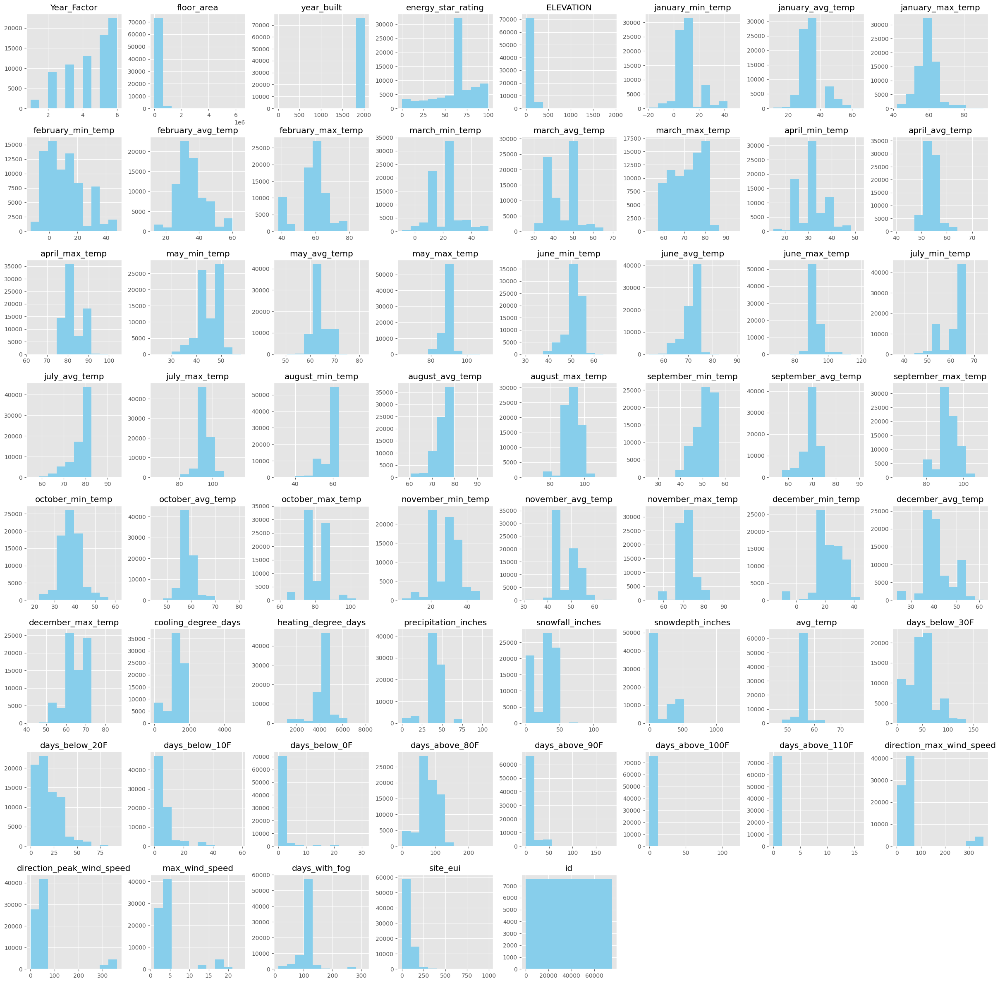

In [13]:

hist = df.hist(figsize=(30,30), color='skyblue')

In [28]:
print(df.columns)

Index(['Year_Factor', 'State_Factor', 'building_class', 'facility_type',
       'floor_area', 'year_built', 'energy_star_rating', 'ELEVATION',
       'january_min_temp', 'january_avg_temp', 'january_max_temp',
       'february_min_temp', 'february_avg_temp', 'february_max_temp',
       'march_min_temp', 'march_avg_temp', 'march_max_temp', 'april_min_temp',
       'april_avg_temp', 'april_max_temp', 'may_min_temp', 'may_avg_temp',
       'may_max_temp', 'june_min_temp', 'june_avg_temp', 'june_max_temp',
       'july_min_temp', 'july_avg_temp', 'july_max_temp', 'august_min_temp',
       'august_avg_temp', 'august_max_temp', 'september_min_temp',
       'september_avg_temp', 'september_max_temp', 'october_min_temp',
       'october_avg_temp', 'october_max_temp', 'november_min_temp',
       'november_avg_temp', 'november_max_temp', 'december_min_temp',
       'december_avg_temp', 'december_max_temp', 'cooling_degree_days',
       'heating_degree_days', 'precipitation_inches', 'snowfall_inc

In [15]:
columns = ['Year_Factor', 'State_Factor', 'building_class', 'facility_type',
       'energy_star_rating', 'ELEVATION',
       'january_min_temp', 'january_avg_temp', 'january_max_temp',
       'february_min_temp', 'february_avg_temp', 'february_max_temp',
       'march_min_temp', 'march_avg_temp', 'march_max_temp', 'april_min_temp',
       'april_avg_temp', 'april_max_temp', 'may_min_temp', 'may_avg_temp',
       'may_max_temp', 'june_min_temp', 'june_avg_temp', 'june_max_temp',
       'july_min_temp', 'july_avg_temp', 'july_max_temp', 'august_min_temp',
       'august_avg_temp', 'august_max_temp', 'september_min_temp',
       'september_avg_temp', 'september_max_temp', 'october_min_temp',
       'october_avg_temp', 'october_max_temp', 'november_min_temp',
       'november_avg_temp', 'november_max_temp', 'december_min_temp',
       'december_avg_temp', 'december_max_temp', 'cooling_degree_days',
       'heating_degree_days', 'precipitation_inches', 'snowfall_inches',
       'snowdepth_inches', 'avg_temp', 'days_below_30F', 'days_below_20F',
       'days_below_10F', 'days_below_0F', 'days_above_80F', 'days_above_90F',
       'days_above_100F', 'days_above_110F', 'direction_max_wind_speed',
       'direction_peak_wind_speed', 'max_wind_speed', 'days_with_fog',
       'site_eui']

omit = [['floor_area', 'year_built', 'days_above_100F', 'days_above_110F', 'id']]

In [29]:
df_new = df[['Year_Factor', 'State_Factor', 'building_class', 'facility_type',
       'energy_star_rating', 'ELEVATION',
        'january_avg_temp',
       'february_avg_temp',
       'march_avg_temp',
       'april_avg_temp', 'may_avg_temp',
       'june_avg_temp',  'july_avg_temp',
       'august_avg_temp',
       'september_avg_temp',
       'october_avg_temp',
       'november_avg_temp',
       'december_avg_temp', 'cooling_degree_days',
       'heating_degree_days',
       'precipitation_inches',
       'snowfall_inches',
       'snowdepth_inches',
       'avg_temp',
       'days_below_30F', 'days_below_20F',
       'days_below_10F', 'days_below_0F', 'days_above_80F', 'days_above_90F',
       'direction_max_wind_speed',
       'direction_peak_wind_speed', 'max_wind_speed', 'days_with_fog',
       'site_eui']]

df_new

,Year_Factor,State_Factor,building_class,facility_type,energy_star_rating,ELEVATION,january_avg_temp,february_avg_temp,march_avg_temp,april_avg_temp,...,days_below_20F,days_below_10F,days_below_0F,days_above_80F,days_above_90F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui
0,1,State_1,Commercial,Grocery_store_or_food_market,11.000000,2.4,50.500000,50.589286,53.693548,55.500000,...,0,0,0,14,0,1.000000,1.000000,1.000000,109.142051,248.682615
1,1,State_1,Commercial,Warehouse_Distribution_or_Shipping_center,45.000000,1.8,50.500000,50.589286,53.693548,55.500000,...,0,0,0,14,0,1.000000,62.779974,1.000000,12.000000,26.500150
2,1,State_1,Commercial,Retail_Enclosed_mall,97.000000,1.8,50.500000,50.589286,53.693548,55.500000,...,0,0,0,14,0,1.000000,62.779974,1.000000,12.000000,24.693619
3,1,State_1,Commercial,Education_Other_classroom,46.000000,1.8,50.500000,50.589286,53.693548,55.500000,...,0,0,0,14,0,1.000000,62.779974,1.000000,12.000000,48.406926
4,1,State_1,Commercial,Warehouse_Nonrefrigerated,100.000000,2.4,50.500000,50.589286,53.693548,55.500000,...,0,0,0,14,0,1.000000,1.000000,1.000000,109.142051,3.899395
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75752,6,State_11,Commercial,Office_Uncategorized,8.000000,36.6,43.451613,47.672414,49.354839,56.266667,...,0,0,0,25,3,66.552675,62.779974,4.190601,109.142051,132.918411
75753,6,State_11,Residential,5plus_Unit_Building,98.000000,36.6,43.451613,47.672414,49.354839,56.266667,...,0,0,0,25,3,66.552675,62.779974,4.190601,109.142051,39.483672
75754,6,State_11,Commercial,Commercial_Other,61.048605,36.6,36.612903,41.637931,41.338710,50.183333,...,2,0,0,6,0,66.552675,62.779974,4.190601,109.142051,48.404398
75755,6,State_11,Commercial,Commercial_Other,61.048605,36.6,36.612903,41.637931,41.338710,50.183333,...,2,0,0,6,0,66.552675,62.779974,4.190601,109.142051,592.022750


In [30]:
df_new.shape

(75757, 35)

In [8]:
!pip install statsmodels

import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.stats.power import TTestIndPower

In [32]:
# # Define parameters for the power analysis
# effect_size = 0.5  # Choose a meaningful effect size
# alpha = 0.05       # Significance level
# power = 0.8        # Desired power

# # Conduct a power analysis for an independent t-test
# analysis = TTestIndPower()

# # Calculate the required sample size
# sample_size = analysis.solve_power(effect_size=effect_size, alpha=alpha, power=power)

# print(f"Required Sample Size: {sample_size}")

# # Visualize the power curve for different sample sizes
# sample_sizes = np.arange(10, 500, 10)
# powers = analysis.plot_power(dep_var="nobs", nobs=sample_sizes, effect_size=effect_size, alpha=alpha)

# plt.title('Power Analysis')
# plt.xlabel('Sample Size')
# plt.ylabel('Power')
# plt.show()

In [33]:
# Select the number of random records you want
num_records = 50  # Adjust this number as needed

# Randomly sample the DataFrame
df_sample = df_new.sample(n=num_records, random_state=42)  # Set random_state for reproducibility


In [35]:
# g = pd.plotting.scatter_matrix(df, figsize=(10,10), marker = 'o', hist_kwds = {'bins': 10}, s = 60, alpha = 0.8)

# plt.show()

In [34]:
sns.pairplot(df_sample)
plt.show()

In [36]:
sns.pairplot(df_sample)
plt.savefig('myfig')

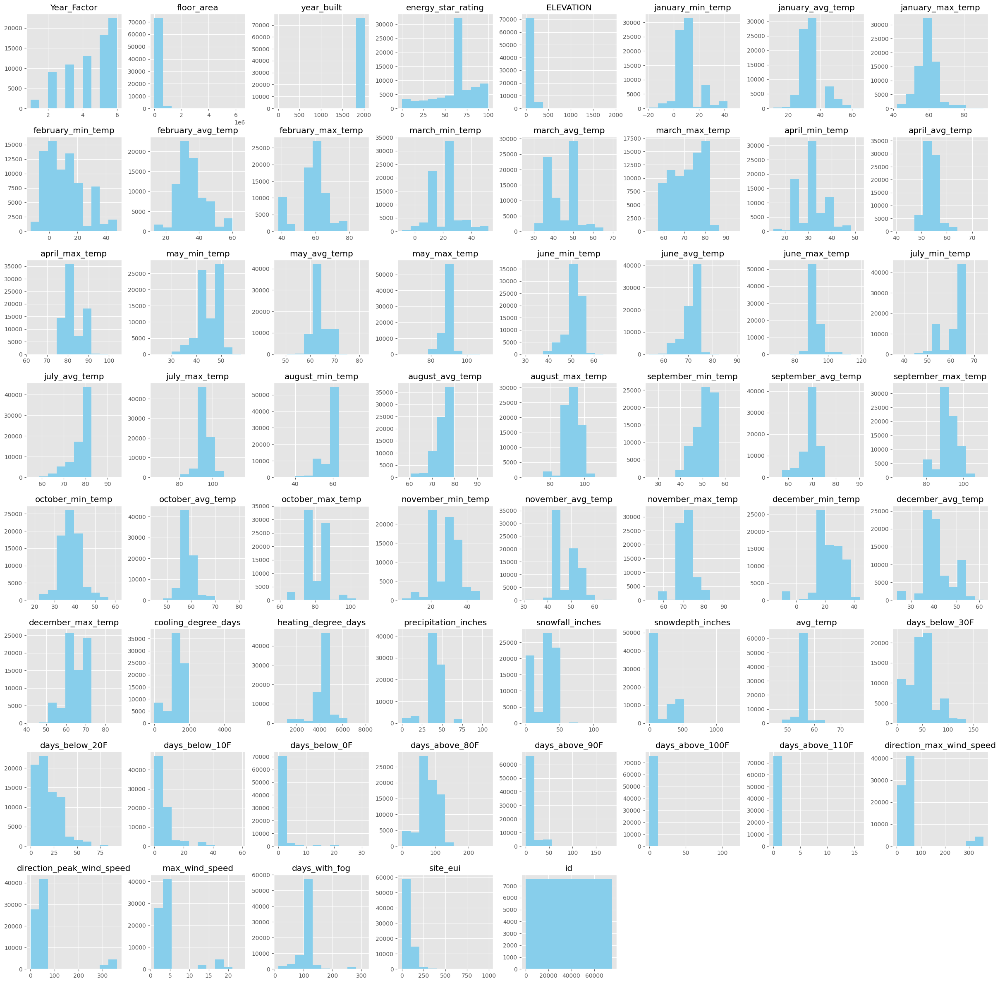

In [40]:
hist = df.hist(figsize=(30,30), color='skyblue')
plt.savefig('distributions')

In [15]:

df_new2 = df[['Year_Factor', 'State_Factor', 'building_class', 'facility_type',
       'energy_star_rating', 'ELEVATION',
       'cooling_degree_days',
       'heating_degree_days',
       'precipitation_inches',
       'snowfall_inches',
       'snowdepth_inches',
       'avg_temp',
    #    'days_below_30F', 'days_below_20F',
    #    'days_below_10F', 'days_below_0F', 'days_above_80F', 'days_above_90F',
       'direction_max_wind_speed',
       'direction_peak_wind_speed', 'max_wind_speed', 'days_with_fog',
       'site_eui']]

df_new2

,Year_Factor,State_Factor,building_class,facility_type,energy_star_rating,ELEVATION,cooling_degree_days,heating_degree_days,precipitation_inches,snowfall_inches,snowdepth_inches,avg_temp,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui
0,1,State_1,Commercial,Grocery_store_or_food_market,11.0,2.4,115,2960,16.59,0.0,0,56.972603,1.0,1.0,1.0,NaN,248.682615
1,1,State_1,Commercial,Warehouse_Distribution_or_Shipping_center,45.0,1.8,115,2960,16.59,0.0,0,56.972603,1.0,NaN,1.0,12.0,26.500150
2,1,State_1,Commercial,Retail_Enclosed_mall,97.0,1.8,115,2960,16.59,0.0,0,56.972603,1.0,NaN,1.0,12.0,24.693619
3,1,State_1,Commercial,Education_Other_classroom,46.0,1.8,115,2960,16.59,0.0,0,56.972603,1.0,NaN,1.0,12.0,48.406926
4,1,State_1,Commercial,Warehouse_Nonrefrigerated,100.0,2.4,115,2960,16.59,0.0,0,56.972603,1.0,1.0,1.0,NaN,3.899395
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75752,6,State_11,Commercial,Office_Uncategorized,8.0,36.6,260,3772,45.03,1.4,1,55.147541,NaN,NaN,NaN,NaN,132.918411
75753,6,State_11,Residential,5plus_Unit_Building,98.0,36.6,260,3772,45.03,1.4,1,55.147541,NaN,NaN,NaN,NaN,39.483672
75754,6,State_11,Commercial,Commercial_Other,NaN,36.6,55,6218,106.32,36.6,438,47.911202,NaN,NaN,NaN,NaN,48.404398
75755,6,State_11,Commercial,Commercial_Other,NaN,36.6,55,6218,106.32,36.6,438,47.911202,NaN,NaN,NaN,NaN,592.022750


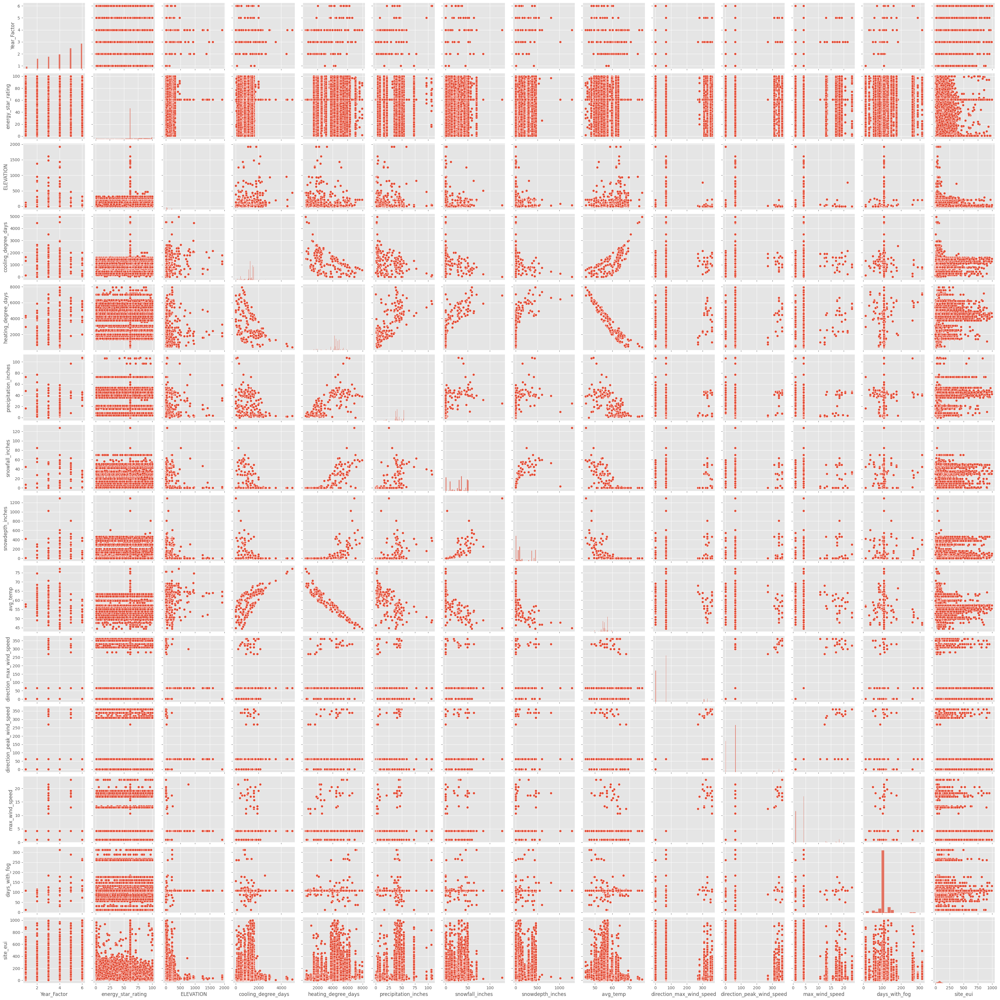

In [46]:
sns.pairplot(df_new2)
plt.show()

Text(0.5, 1.015, 'Energy consumption by building class')

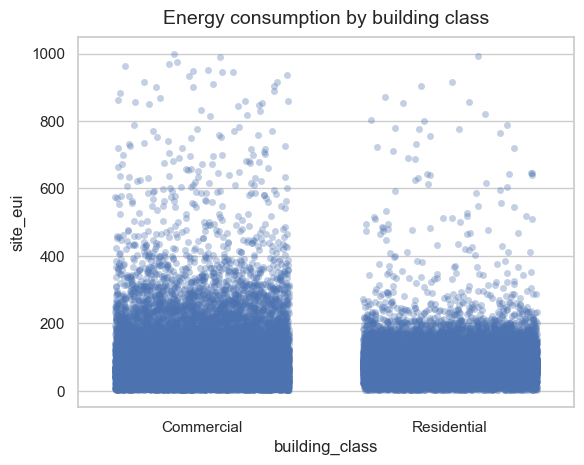

In [28]:
columns = ['Year_Factor', 'State_Factor', 'building_class', 'facility_type',
       'energy_star_rating', 'ELEVATION',
       'cooling_degree_days',
       'heating_degree_days',
       'precipitation_inches',
       'snowfall_inches',
       'snowdepth_inches',
       'avg_temp',
    #    'days_below_30F', 'days_below_20F',
    #    'days_below_10F', 'days_below_0F', 'days_above_80F', 'days_above_90F',
       'direction_max_wind_speed',
       'direction_peak_wind_speed', 'max_wind_speed', 'days_with_fog',
       'site_eui']

# array(['Commercial', 'Residential'], dtype=object)

data = df[columns]

x = sns.stripplot(data = data, x = 'building_class', y = 'site_eui',
           jitter = 0.35 , alpha =  1/3);
plt.title('Energy consumption by building class', fontsize=14, y=1.015)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


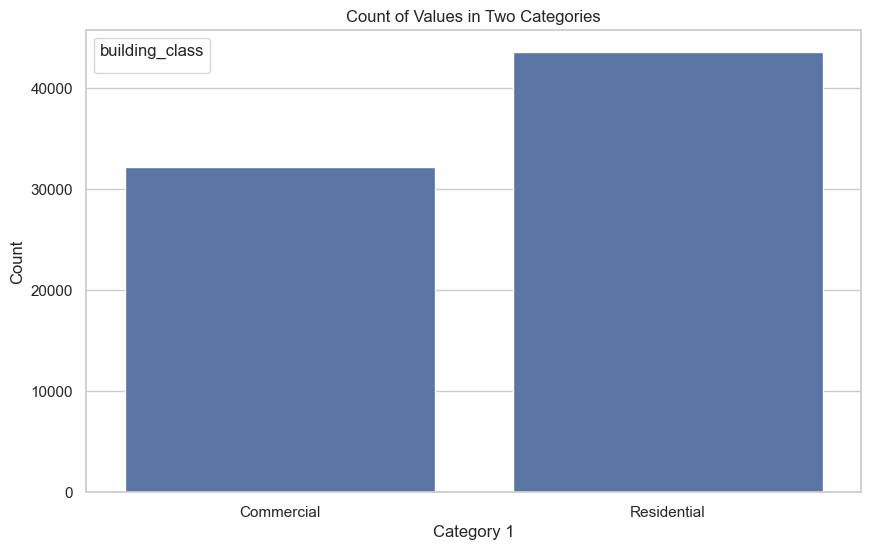

In [31]:
plt.figure(figsize=(10, 6))
sns.countplot(x='building_class', data=data)
plt.title('Count of Values in Two Categories')
plt.xlabel('Category 1')
plt.ylabel('Count')
plt.legend(title='building_class')

plt.show()

Text(0.5, 1.0, 'Boxplot das notas de matemática pela renda')

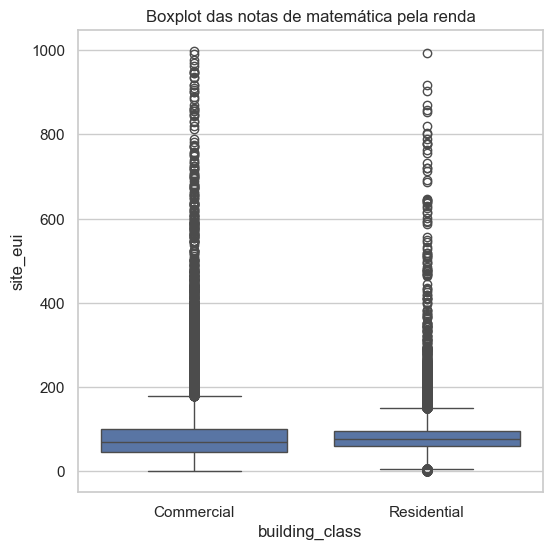

In [36]:
plt.figure(figsize=(6,6))
sns.boxplot(x='building_class', y = 'site_eui', data = data)
plt.title('Boxplot das notas de matemática pela renda')

In [43]:
# outliers
data['building_class'].boxplot(grid=False, figsize= (15,8))
plt.xticks(rotation=45, ha="right")

AttributeError: 'Series' object has no attribute 'boxplot'

ValueError: could not convert string to float: 'State_1'

ML

In [8]:
le = LabelEncoder()
for col in categorical_features:
    df[col] = le.fit_transform(df[col])

In [9]:
df.head()

,Year_Factor,State_Factor,building_class,facility_type,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
0,1,0,0,13,61242.0,1942.0,11.0,2.4,36,50.5,...,14,0,0,0,1.0,1.000000,1.0,109.142051,248.682615,0
1,1,0,0,55,274000.0,1955.0,45.0,1.8,36,50.5,...,14,0,0,0,1.0,62.779974,1.0,12.000000,26.500150,1
2,1,0,0,48,280025.0,1951.0,97.0,1.8,36,50.5,...,14,0,0,0,1.0,62.779974,1.0,12.000000,24.693619,2
3,1,0,0,6,55325.0,1980.0,46.0,1.8,36,50.5,...,14,0,0,0,1.0,62.779974,1.0,12.000000,48.406926,3
4,1,0,0,56,66000.0,1985.0,100.0,2.4,36,50.5,...,14,0,0,0,1.0,1.000000,1.0,109.142051,3.899395,4


In [10]:
df.describe().style.background_gradient()

,Year_Factor,State_Factor,building_class,facility_type,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,february_max_temp,march_min_temp,march_avg_temp,march_max_temp,april_min_temp,april_avg_temp,april_max_temp,may_min_temp,may_avg_temp,may_max_temp,june_min_temp,june_avg_temp,june_max_temp,july_min_temp,july_avg_temp,july_max_temp,august_min_temp,august_avg_temp,august_max_temp,september_min_temp,september_avg_temp,september_max_temp,october_min_temp,october_avg_temp,october_max_temp,november_min_temp,november_avg_temp,november_max_temp,december_min_temp,december_avg_temp,december_max_temp,cooling_degree_days,heating_degree_days,precipitation_inches,snowfall_inches,snowdepth_inches,avg_temp,days_below_30F,days_below_20F,days_below_10F,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
count,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000
mean,4.367755,4.237998,0.574970,25.931914,165983.865858,1953.996726,61.048605,39.506323,11.432343,34.310468,59.054952,11.720567,35.526837,58.486278,21.606281,44.469292,70.897831,32.037171,53.784863,82.661932,44.706179,63.742547,88.987856,51.131763,71.066384,91.400280,60.571604,76.596879,95.543950,58.515068,75.348749,92.572581,50.791689,69.597545,92.171139,38.210911,58.727038,81.135671,28.630397,48.123133,71.202397,22.736777,41.625569,64.496852,1202.250446,4324.957390,42.430651,29.136379,164.862455,56.176705,48.756511,17.447932,4.886532,0.876764,82.709809,14.058701,0.279539,0.002442,66.552675,62.779974,4.190601,109.142051,82.584693,37878.000000
std,1.471441,1.549536,0.494351,11.645404,246875.790940,38.139247,23.063738,60.656596,9.381027,6.996108,5.355458,12.577272,8.866697,8.414611,10.004303,6.657142,7.680982,5.577279,2.500473,4.101028,4.200319,2.792919,2.864669,3.415926,2.861681,3.604068,4.177109,4.090275,4.157118,4.441992,3.818895,4.139685,4.290884,3.603773,5.011708,5.093899,2.641300,5.579513,7.153244,4.094207,4.373374,9.014047,5.869386,6.054104,391.561780,824.366727,10.592205,17.810894,175.275869,2.241940,27.587124,14.469435,7.071221,2.894244,25.282913,10.943996,2.252323,0.142140,88.726751,87.226977,4.369629,31.883663,58.255403,21869.306509
min,1.000000,0.000000,0.000000,0.000000,943.000000,0.000000,0.000000,-6.400000,-19.000000,10.806452,42.000000,-13.000000,13.250000,38.000000,-9.000000,25.854839,53.000000,15.000000,40.280000,62.000000,23.000000,46.950000,64.000000,30.000000,54.100000,67.000000,37.000000,54.822581,65.000000,31.000000,56.693548,66.000000,26.000000,53.600000,64.000000,18.000000,44.693548,59.000000,4.000000,30.766667,53.000000,-16.000000,23.790323,42.000000,0.000000,398.000000,0.000000,0.000000,0.000000,44.512329,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,12.000000,1.001169,0.000000
25%,3.000000,4.000000,0.000000,27.000000,62379.000000,1927.000000,56.000000,11.900000,6.000000,29.827586,56.000000,2.000000,31.625000,55.000000,13.000000,38.096774,62.000000,26.000000,52.333333,80.000000,42.000000,62.790323,88.000000,50.000000,70.983333,89.000000,57.000

In [11]:
import copy
y = df["site_eui"]
train = df.drop(["site_eui","id"],axis =1)
trainnames = copy.deepcopy(train)
scaler = StandardScaler()
train = scaler.fit_transform(train)


In [12]:
train

array([[-2.28876040e+00, -2.73502847e+00, -1.16308853e+00, ...,
        -7.08271499e-01, -7.30181542e-01,  4.45712541e-16],
       [-2.28876040e+00, -2.73502847e+00, -1.16308853e+00, ...,
        -8.14595953e-17, -7.30181542e-01, -3.04678581e+00],
       [-2.28876040e+00, -2.73502847e+00, -1.16308853e+00, ...,
        -8.14595953e-17, -7.30181542e-01, -3.04678581e+00],
       ...,
       [ 1.10929044e+00, -1.44431120e+00, -1.16308853e+00, ...,
        -8.14595953e-17,  4.06526186e-16,  4.45712541e-16],
       [ 1.10929044e+00, -1.44431120e+00, -1.16308853e+00, ...,
        -8.14595953e-17,  4.06526186e-16,  4.45712541e-16],
       [ 1.10929044e+00, -1.44431120e+00,  8.59779779e-01, ...,
        -8.14595953e-17,  4.06526186e-16,  4.45712541e-16]])

In [13]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(train, y, test_size = 0.2, random_state = 50)


In [14]:
X_test_ft=pd.DataFrame(X_test,columns=trainnames.columns)
X_test_ft.shape

(15152, 62)

In [15]:
import xgboost as xgb
xgboost_model = xgb.XGBRegressor(n_estimators=200, learning_rate=0.02, gamma=0, subsample=0.75,
                           colsample_bytree=0.4, max_depth=5)
xgboost_model.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.4, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.02, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [16]:
#!pip install eli5
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(xgboost_model, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = trainnames.columns.tolist(), top=63)

Weight,Feature
0.2882 ± 0.0077,energy_star_rating
0.1853 ± 0.0054,facility_type
0.0850 ± 0.0047,floor_area
0.0403 ± 0.0059,building_class
0.0202 ± 0.0013,State_Factor
0.0145 ± 0.0016,year_built
0.0105 ± 0.0003,january_avg_temp
0.0042 ± 0.0003,ELEVATION
0.0042 ± 0.0004,january_min_temp
0.0033 ± 0.0006,heating_degree_days


In [17]:
explainer = shap.Explainer(xgboost_model)
shap_values = explainer(X_test_ft)

[10:46:08] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


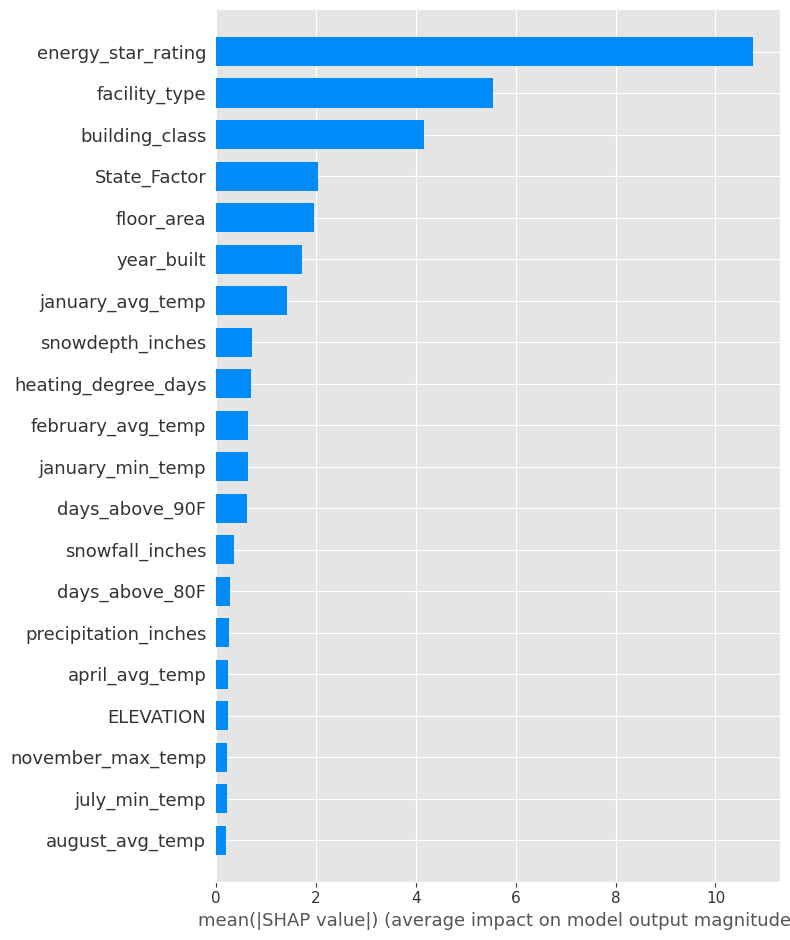

In [18]:
#Variable Importance Plot
shap.summary_plot(shap_values, X_test_ft,plot_type="bar")

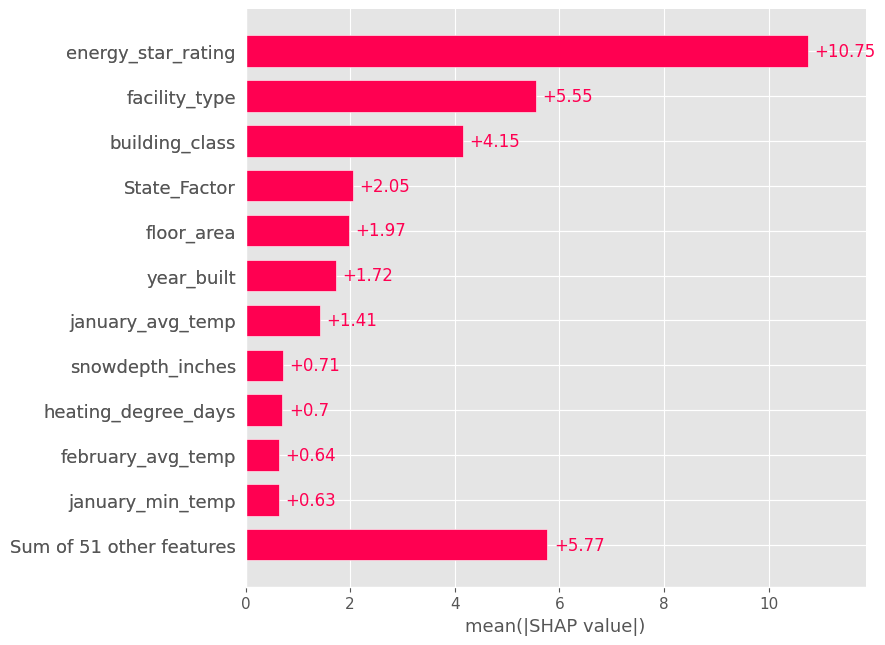

In [19]:
shap.plots.bar(shap_values,max_display=12)

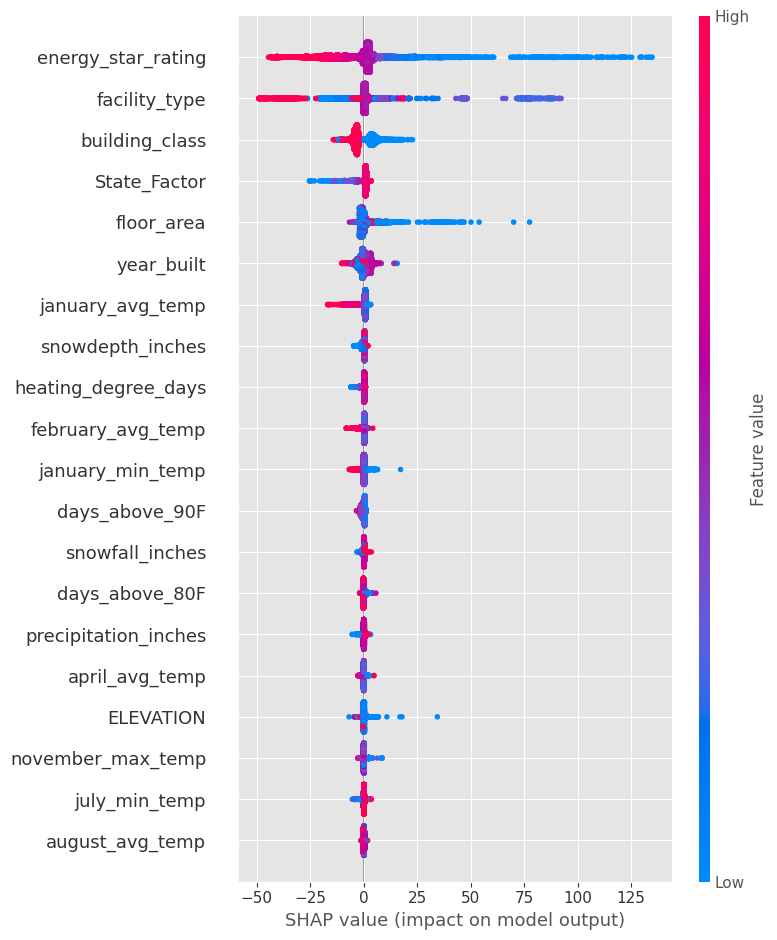

In [20]:
shap.summary_plot(shap_values, X_test_ft)

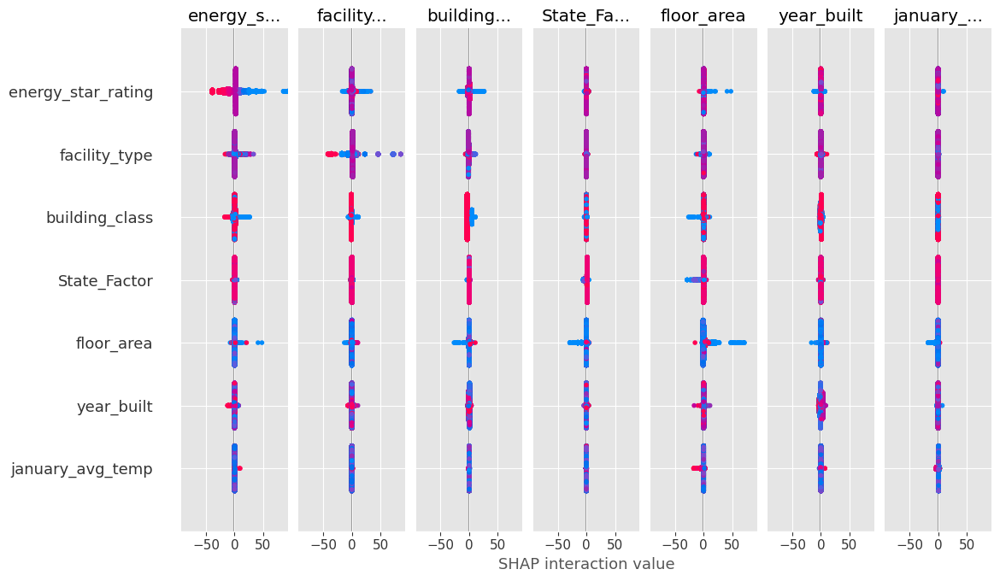

In [21]:
shap_interaction_values = explainer.shap_interaction_values(X_test_ft)
shap.summary_plot(shap_interaction_values, X_test_ft)

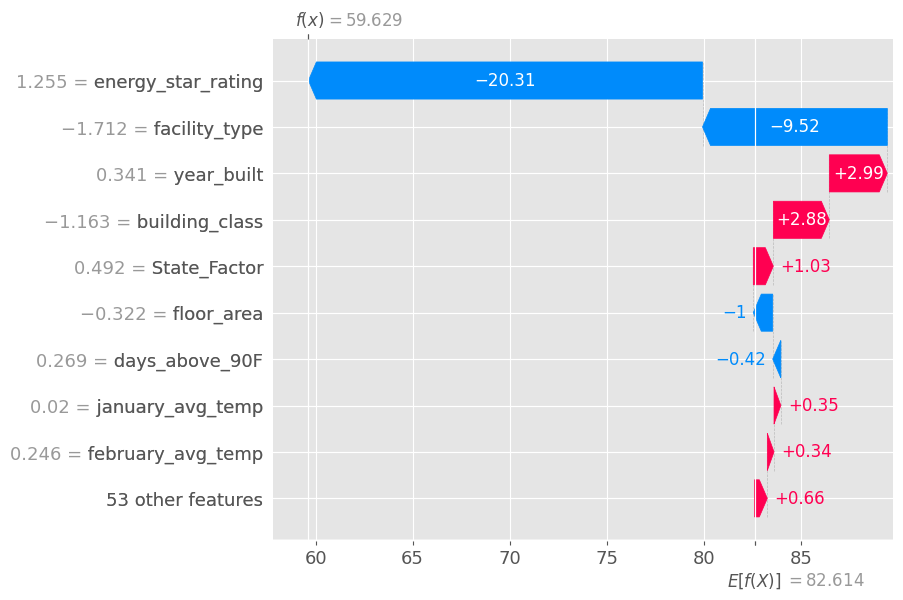

In [22]:
shap.plots.waterfall(shap_values[0])

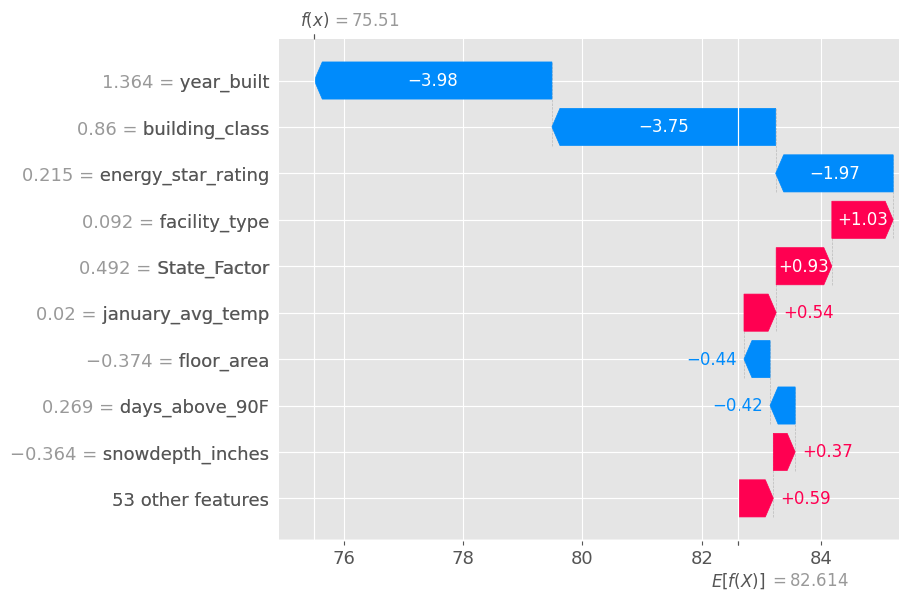

In [23]:
shap.plots.waterfall(shap_values[1])

In [24]:
explainer = shap.TreeExplainer(xgboost_model)
shap_values = explainer.shap_values(X_test_ft)
shap.initjs()
def p(j):
    return(shap.force_plot(explainer.expected_value, shap_values[j,:], X_test_ft.iloc[j,:]))
p(0)

[10:53:49] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


In [25]:
p(1)

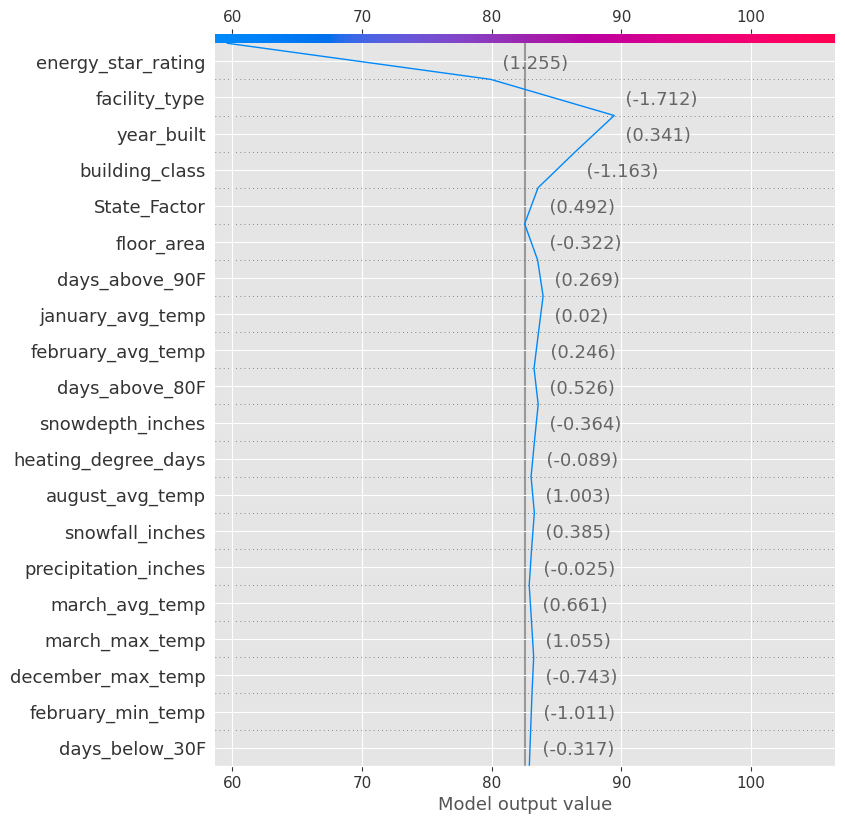

In [26]:
expected_value = explainer.expected_value
shap_values = explainer.shap_values(X_test_ft)[0]
shap.decision_plot(expected_value, shap_values, X_test_ft)

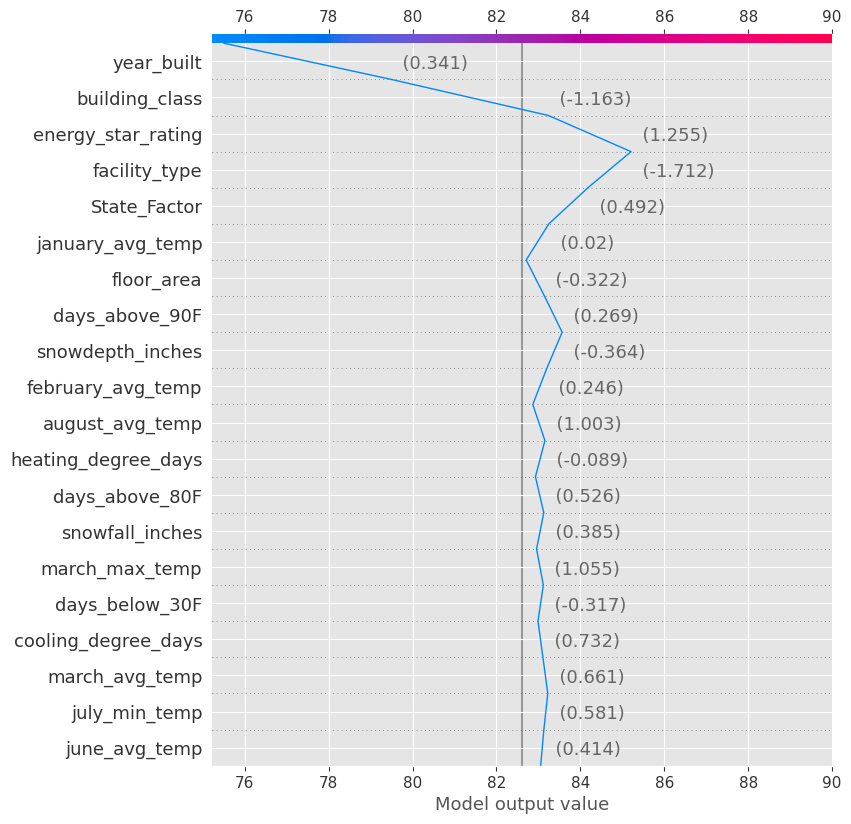

In [27]:
shap_values = explainer.shap_values(X_test_ft)[1]
shap.decision_plot(expected_value, shap_values, X_test_ft)

In [28]:
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,
                    feature_names=trainnames.columns,
                    class_names=['site_eui'],
                    categorical_features=categorical_features,
                    verbose=True, mode='regression')

Intercept 80.98240565809971
Prediction_local [101.18704281]
Right: 59.629116


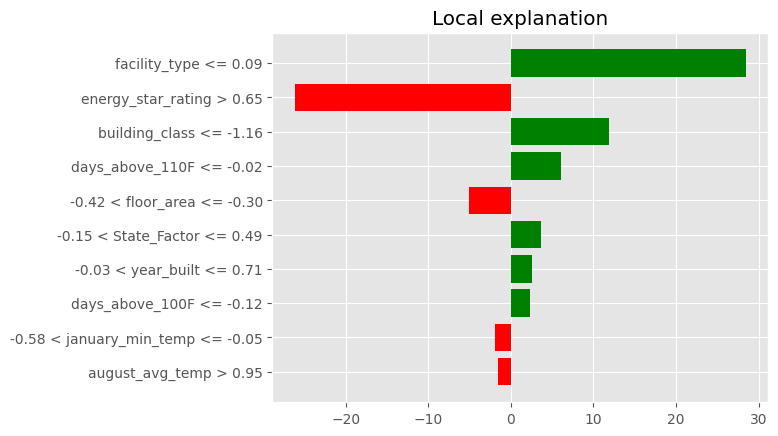

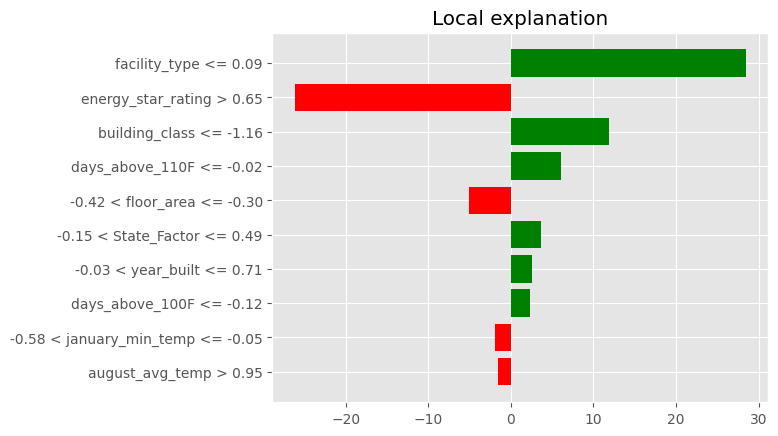

In [29]:
exp = explainer.explain_instance(X_test_ft.iloc[0],
     xgboost_model.predict, num_features=10)
exp.as_pyplot_figure()

EDA